In [ ]:
!pip install xgboost==1.5.1
!pip install lightgbm
!pip install shap

In [2]:
import platform

from datetime import datetime
from pathlib import Path
from zipfile import ZipFile

import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn
import plotly.graph_objects as go
import plotly.express as px
import xgboost as xgb
import re
import lightgbm as lgb
import shap

from sklearn import (
    decomposition,
    discriminant_analysis,
    ensemble,
    linear_model,
    metrics,
    model_selection,
    naive_bayes,
    pipeline,
    preprocessing,
    svm,
)
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, HalvingRandomSearchCV
import warnings
warnings.filterwarnings("ignore")

c:\Users\Marwa\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


## 1. Understanding the problem

### Metric

Why the metric used here is the [`sklearn.metrics.balanced_accuracy_score`](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.balanced_accuracy_score.html) rather than simply [`sklearn.metrics.accuracy_score`](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html) ?


It is because the problem is unbalanced. We have more person coming out of the hostpital alive compared to people dying in the hospital.
Since the dataset is unbalanced, we need to use the balanced_accuracy_score metric.

## 2. Data loading

In [5]:
DATA = Path("datasets")
TRAIN_PATH = DATA / "train"
TEST_PATH = DATA / "test"

In [12]:
df_train = pd.read_csv(TRAIN_PATH / "train_features_sent.csv")
df_train_labels = pd.read_csv(TRAIN_PATH / "train_labels_sent.csv")

In [15]:
df_train['target'] = df_train_labels['energy_consumption_per_annum']

In [16]:
df_train.head(5)

,level_0,additional_heat_generators,additional_water_heaters,altitude,area_code,balcony_depth,bearing_wall_material,building_category,building_class,building_height_ft,...,water_heaters,water_heating_energy_source,water_heating_type,window_filling_type,window_frame_material,window_glazing_type,window_heat_retention_factor,window_orientation,window_thermal_conductivity,target
0,111323,[wood stove or insert],NaN,328.08400,881,NaN,CONCRETE,[],[],13.779528,...,[indeterminate oil boiler],oil,individual,argon or krypton,pvc,double glazing,1.116894,"[est,west]",15.347292,290.166345
1,265182,[],NaN,360.89240,260,NaN,NaN,[condo],[2 to 11],43.635172,...,[indeterminate gas boiler],gas,individual,argon or krypton,wood,double glazing,1.133072,"[est,west,sud]",17.512631,169.818197
2,927507,[],NaN,324.80316,573,NaN,WOOD - OTHER,[],[],19.685040,...,[standard gas boiler],gas,individual,dry air,pvc,double glazing,1.084204,"[est,west]",16.779108,144.499711
3,874620,[],NaN,288.71392,204,NaN,BRICKS,[],[],13.779528,...,[electric storage tank],electricity,individual,NaN,metal with thermal break,triple glazing,0.983338,"[est,north,sud]",12.630033,158.742715
4,563274,[],NaN,849.73756,374,NaN,GRITSTONE,[individual house],[individual],19.028872,...,[thermodynamic electric hot water (pac or tank)],thermodynamic electric hot water (heat pump or...,individual,dry air,pvc,double glazing,1.084204,"[north,sud]",13.290529,82.223648


In [31]:
df_train['balcony_depth'].value_counts()

1 <= … < 2    42572
2 <= … < 3    24270
3 <=          20444
< 1 m         18505
Name: balcony_depth, dtype: int64

In [26]:
# df_train.dtypes.index
df_train.dtypes

level_0                           int64
additional_heat_generators       object
additional_water_heaters         object
altitude                        float64
area_code                         int64
                                 ...   
window_glazing_type              object
window_heat_retention_factor    float64
window_orientation               object
window_thermal_conductivity     float64
target                          float64
Length: 72, dtype: object

In [27]:
for t,index in zip(df_train.dtypes, df_train.dtypes.index):
    print(index,t)

level_0 int64
additional_heat_generators object
additional_water_heaters object
altitude float64
area_code int64
balcony_depth object
bearing_wall_material object
building_category object
building_class object
building_height_ft float64
building_period object
building_total_area_sqft float64
building_type object
building_use_type_code int64
building_use_type_description object
building_year float64
clay_risk_level object
consumption_measurement_date object
has_air_conditioning bool
has_balcony object
heat_generators object
heating_energy_source object
heating_type object
is_crossing_building object
living_area_sqft float64
lowe_floor_thermal_conductivity float64
lower_floor_adjacency_type object
lower_floor_insulation_type object
lower_floor_material object
main_heat_generators object
main_heating_type object
main_water_heaters object
main_water_heating_type object
nb_commercial_units float64
nb_dwellings int64
nb_gas_meters_commercial float64
nb_gas_meters_housing float64
nb_gas_meter

In [17]:
df_train.describe()

,level_0,altitude,area_code,building_height_ft,building_total_area_sqft,building_use_type_code,building_year,living_area_sqft,lowe_floor_thermal_conductivity,nb_commercial_units,...,nb_power_meters_housing,nb_power_meters_total,nb_units_total,outer_wall_thermal_conductivity,percentage_glazed_surfaced,post_code,upper_floor_thermal_conductivity,window_heat_retention_factor,window_thermal_conductivity,target
count,1.010684e+06,992545.000000,1.010684e+06,994468.000000,949721.000000,1.010684e+06,951235.000000,1.010672e+06,933373.000000,116104.000000,...,95221.000000,95221.000000,116104.000000,1.003326e+06,882511.000000,1.010684e+06,964886.000000,988325.000000,1.005579e+06,1.010684e+06
mean,7.540240e+05,453.935478,5.175532e+02,20.006577,1642.593517,1.227803e+00,1973.982554,1.227738e+03,3.308581,16.903409,...,26.063373,25.516544,104.102666,4.687868e+00,0.827719,5.102518e+07,2.237627,1.247048,1.714496e+01,2.457073e+02
std,4.356355e+05,513.079778,2.387919e+02,12.960314,1963.887500,5.607223e-01,38.921732,2.496711e+03,0.720945,91.571939,...,44.429343,44.207655,317.412876,3.063425e+00,0.176220,2.427389e+07,0.852095,0.569495,5.779591e+00,8.054060e+02
min,0.000000e+00,-9.842520,1.090000e+02,0.000000,64.583400,1.000000e+00,1200.000000,0.000000e+00,2.282947,0.000000,...,0.000000,0.000000,0.000000,1.088024e+00,0.310000,1.000122e+07,1.488072,0.243582,2.780761e+00,-2.040219e+03
25%,3.768322e+05,124.671920,3.040000e+02,12.795276,882.639800,1.000000e+00,1964.000000,7.965286e+02,2.797533,0.000000,...,6.760000,6.450000,12.000000,2.447516e+00,0.720170,3.034212e+07,1.770545,1.084204,1.396372e+01,1.647793e+02
50%,7.536310e+05,295.275600,5.200000e+02,17.060368,1205.556800,1.000000e+00,1979.000000,1.022571e+03,2.844251,0.000000,...,15.000000,15.000000,32.000000,2.944443e+00,0.786523,5.049011e+07,1.890570,1.133072,1.605727e+01,2.237132e+02
75%,1.131399e+06,597.112880,7.040000e+02,22.637796,1646.876700,1.000000e+00,1999.000000,1.334724e+03,4.070746,8.000000,...,30.000000,29.000000,87.000000,5.515635e+00,0.886707,7.200292e+07,2.201487,1.212343,1.901402e+01,3.007878e+02
max,1.508482e+06,6167.979200,9.520000e+02,511.811040,230444.335100,5.000000e+00,2019.000000,3.815157e+05,5.960612,10874.000000,...,4463.000000,4490.230000,42317.350000,2.652868e+01,1.998632,9.992662e+07,5.547723,15.891206,2.122490e+02,2.594328e+05


## 3. Exploratory analysis

#### Features' types

In [ ]:
types = pd.read_csv(DATA / "mimic_synthetic_feat.type", header=None).set_index(
    features
)[0]

types.value_counts()


Numerical      226
Binary         107
Categorical      8
Name: 0, dtype: int64

#### Target feature distribution

In [ ]:
ys.describe()


count     8e+04
mean    0.03496
std      0.1837
min           0
25%           0
50%           0
75%           0
max           1
dtype: float64

### Code: Produce the following graphs

* Bar chart to show the target feature distribution

* Bar charts of 4 categorical variables (e.g., "LANGUAGE", "MARITAL_STATUS")

* Show the correlation between a selection of features and the target feature y

* Another graph or any exploratory analysis you can think of

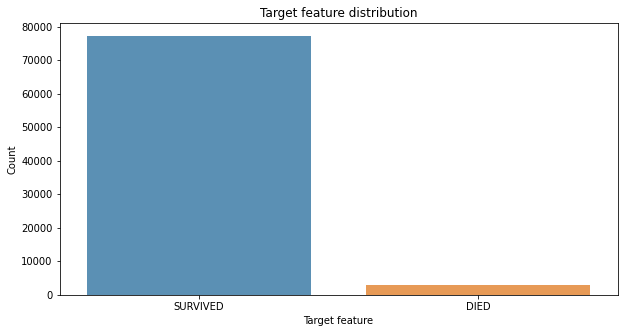

In [ ]:
#Bar chart that shows the target feature distribution

plt.figure(figsize=(10, 5))
sns.barplot(["SURVIVED","DIED"], ys.value_counts().values, alpha=0.8)
plt.ylabel("Count")
plt.xlabel("Target feature")
plt.title("Target feature distribution")
plt.show()

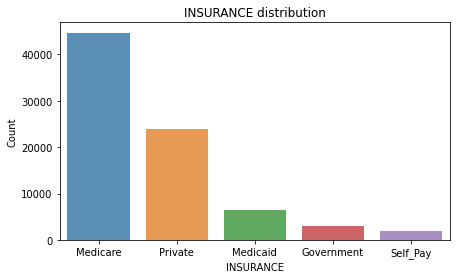

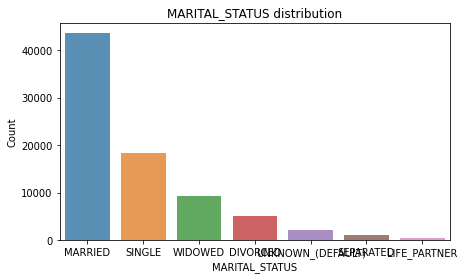

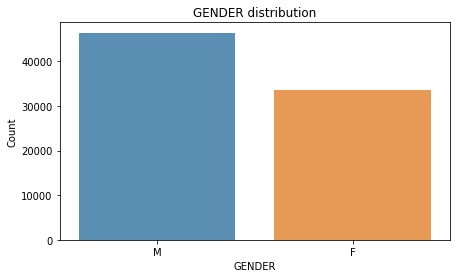

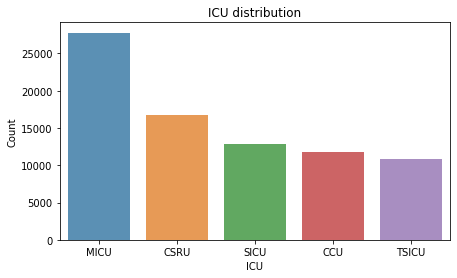

In [ ]:
# Bar charts of 4 categorical variables
for col in ['INSURANCE', 'MARITAL_STATUS', 'GENDER', 'ICU']:
    plt.figure(figsize=(7, 4))
    sns.barplot(x_df[col].value_counts().index, x_df[col].value_counts().values, alpha=0.8)
    plt.ylabel("Count")
    plt.xlabel(col)
    plt.title(col + " distribution")
    plt.show()


In [ ]:
# Print correlation matrix Plotly
fig = go.Figure(data=go.Heatmap(
    z=x_df.corr().values,
    x=x_df.columns.values,
    y=x_df.columns.values,
))

fig.show()


### 10 Most correlated features

In [ ]:
df_copy = x_df.copy()
df_copy['target'] = ys.copy()
most_correlated_features_abs = df_copy.corr()['target'].abs().sort_values(ascending=False)[:11]
most_correlated_features = df_copy.corr()['target'][most_correlated_features_abs.index]
most_correlated_features.drop(['target'],inplace=True)
most_correlated_features

RESP_RATE_MEAN_DAY1   0.09577
Adltrespfl            0.09083
RESP_RATE_MAX_DAY1    0.09065
RESP_RATE_MEAN_DAY2   0.08938
RESP_RATE_MAX_DAY2    0.08614
HR_MAX_DAY2           0.07349
HR_MAX_DAY1            0.0726
HR_MEAN_DAY2          0.06608
TEMP_MAX_DAY2         0.06509
HR_MIN_DAY1           0.06478
Name: target, dtype: float64

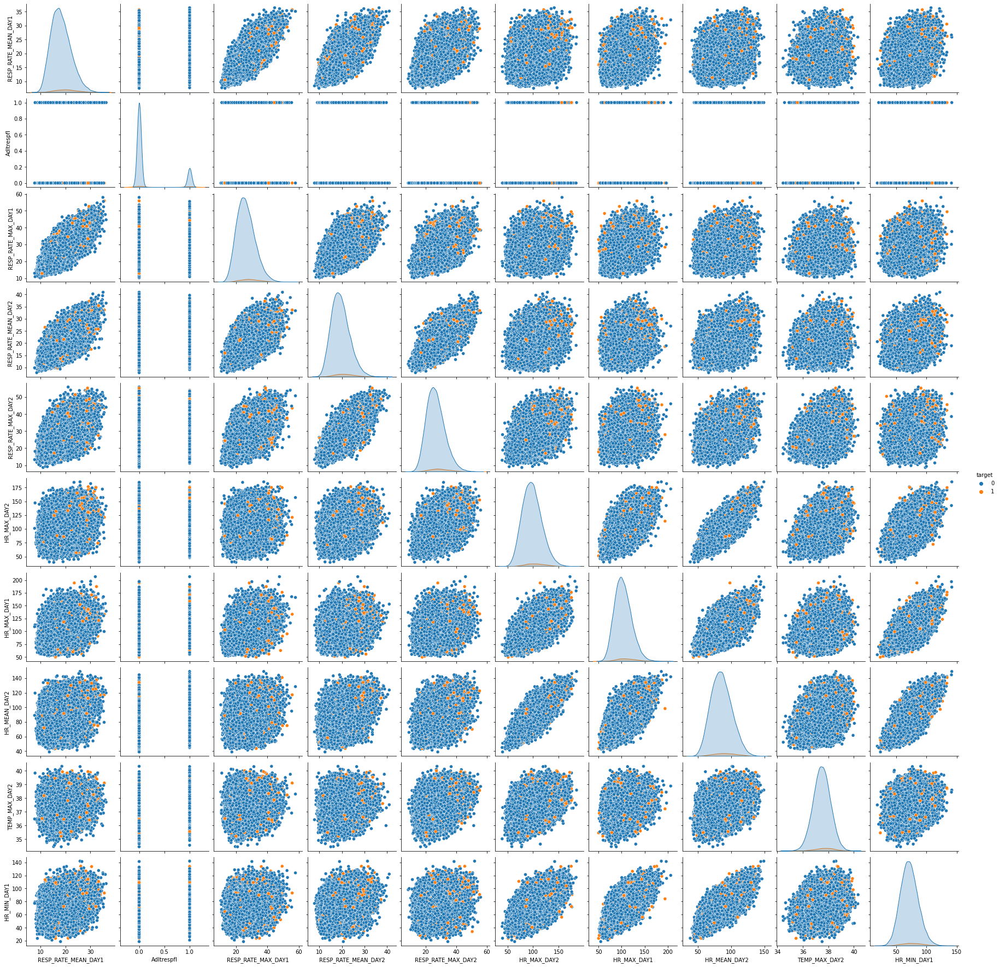

In [ ]:
sns.pairplot(df_copy[most_correlated_features.index.tolist()+['target']],hue="target")

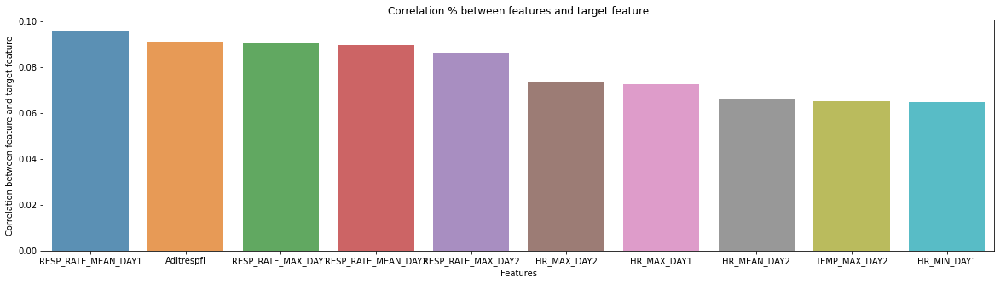

In [ ]:
### Plotting a barplot of the correlation betweens features and the target feature y
plt.figure(figsize=(20, 5))
sns.barplot(most_correlated_features.index,most_correlated_features.values,alpha=0.8)
plt.ylabel("Correlation between feature and target feature")
plt.xlabel("Features")
plt.title("Correlation % between features and target feature")
plt.show()

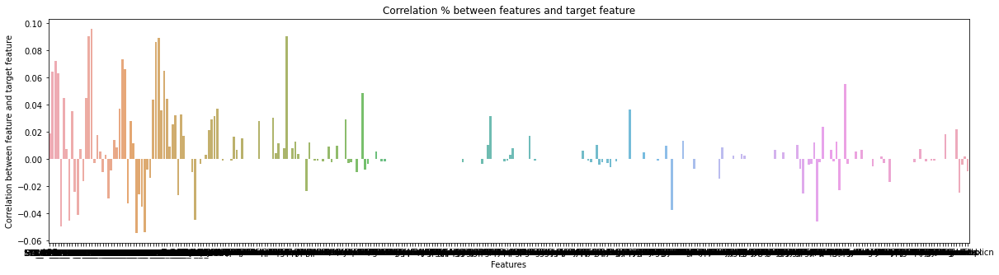

In [ ]:
plt.figure(figsize=(20, 5))
sns.barplot(x_df.corrwith(ys).index,x_df.corrwith(ys).values,alpha=0.8)
plt.ylabel("Correlation between feature and target feature")
plt.xlabel("Features")
plt.title("Correlation % between features and target feature")
plt.show()


## 4. Preprocessing

### Gender encoding [Female -> 0 , Male -> 1]

In [ ]:
# Mp 0,1 to column
x_df[x_df.columns.values[5]] = x_df[x_df.columns.values[5]].map({"M": 1, "F": 0})
x_test_df[x_df.columns.values[5]] = x_test_df[x_df.columns.values[5]].map({"M": 1, "F": 0})

x_baseline_df = x_df.copy()
x_baseline_test_df = x_test_df.copy()

### Reduce data scarcity (not enough data per class)

Explore data scarcity in the feature Religion

In [ ]:
nb_values = len(x_baseline_df["RELIGION"].value_counts())
print(f"Number of different values : {nb_values} ")
x_baseline_df["RELIGION"].value_counts(normalize=True)

Number of different values : 20 


CATHOLIC                    0.3798
NOT_SPECIFIED               0.1889
UNOBTAINABLE                0.1095
PROTESTANT_QUAKER           0.1088
JEWISH                     0.09249
OTHER                      0.05804
EPISCOPALIAN               0.01864
GREEK_ORTHODOX             0.01058
CHRISTIAN_SCIENTIST       0.009663
BUDDHIST                  0.005938
MUSLIM                    0.004138
JEHOVAH'S_WITNESS         0.003513
UNITARIAN-UNIVERSALIST      0.0033
HINDU                     0.002125
ROMANIAN_EAST._ORTH       0.001763
7TH_DAY_ADVENTIST         0.001413
BAPTIST                    0.00085
HEBREW                   0.0004375
METHODIST                  7.5e-05
LUTHERAN                   2.5e-05
Name: RELIGION, dtype: float64

In [ ]:
categorical_names = np.delete(types[types == "Categorical"].index.values, np.where(types[['ADMITTIME', 'DISCHTIME']])) 

# Group rare categories (less than 10% of the total) of variables into a new category
def condense_category(col, min_freq=0.1, new_name='OTHER'):
    series = pd.value_counts(col)
    mask = (series/series.sum()).lt(min_freq)
    return pd.Series(np.where(col.isin(series[mask].index), new_name, col))

condense_category(x_baseline_df["RELIGION"]).value_counts(normalize=True)

CATHOLIC            0.3798
OTHER                0.213
NOT_SPECIFIED       0.1889
UNOBTAINABLE        0.1095
PROTESTANT_QUAKER   0.1088
dtype: float64

In [ ]:


def group_rare_categories(data_df,show=False):
    for var in categorical_names:
        data_df[var] = condense_category(data_df[var], min_freq=0.02, new_name='OTHER')
        print(f"<<< {var} >>>")
        display(data_df[var].value_counts(normalize=True))
        
    return data_df
    
x_baseline_df = group_rare_categories(x_baseline_df.copy(), show=True)
x_baseline_test_df = group_rare_categories(x_baseline_test_df.copy())



<<< INSURANCE >>>


Medicare      0.5584
Private       0.2996
Medicaid     0.08043
Government   0.03666
Self_Pay     0.02498
Name: INSURANCE, dtype: float64

<<< LANGUAGE >>>


ENGL     0.9467
OTHER   0.05331
Name: LANGUAGE, dtype: float64

<<< RELIGION >>>


CATHOLIC             0.3798
NOT_SPECIFIED        0.1889
OTHER                0.1205
UNOBTAINABLE         0.1095
PROTESTANT_QUAKER    0.1088
JEWISH              0.09249
Name: RELIGION, dtype: float64

<<< MARITAL_STATUS >>>


MARRIED              0.5458
SINGLE                0.229
WIDOWED              0.1172
DIVORCED            0.06269
UNKNOWN_(DEFAULT)   0.02643
OTHER               0.01894
Name: MARITAL_STATUS, dtype: float64

<<< ETHNICITY >>>


WHITE                     0.7466
OTHER                     0.1526
UNKNOWN/NOT_SPECIFIED    0.05429
BLACK/AFRICAN_AMERICAN   0.04648
Name: ETHNICITY, dtype: float64

<<< ICU >>>


MICU    0.3473
CSRU    0.2099
SICU      0.16
CCU     0.1471
TSICU   0.1357
Name: ICU, dtype: float64

<<< INSURANCE >>>


Medicare      0.5625
Private       0.2948
Medicaid     0.07925
Government   0.03605
Self_Pay     0.02745
Name: INSURANCE, dtype: float64

<<< LANGUAGE >>>


ENGL    0.9441
OTHER   0.0559
Name: LANGUAGE, dtype: float64

<<< RELIGION >>>


CATHOLIC             0.3758
NOT_SPECIFIED        0.1882
OTHER                0.1224
UNOBTAINABLE         0.1104
PROTESTANT_QUAKER    0.1104
JEWISH              0.09275
Name: RELIGION, dtype: float64

<<< MARITAL_STATUS >>>


MARRIED              0.5428
SINGLE               0.2317
WIDOWED                0.12
DIVORCED            0.06085
UNKNOWN_(DEFAULT)   0.02485
OTHER                0.0198
Name: MARITAL_STATUS, dtype: float64

<<< ETHNICITY >>>


WHITE                    0.7465
OTHER                    0.1526
UNKNOWN/NOT_SPECIFIED    0.0544
BLACK/AFRICAN_AMERICAN   0.0465
Name: ETHNICITY, dtype: float64

<<< ICU >>>


MICU     0.347
CSRU    0.2117
SICU     0.164
CCU     0.1451
TSICU   0.1321
Name: ICU, dtype: float64

### Removing constants

Why we are dropping these columns? Basically, because cant train the model to use these features without observing their influence.

In [ ]:
x_baseline_df_copy = x_baseline_df.copy()
x_baseline_test_df_copy = x_baseline_test_df.copy()
types_copy = types.copy()

In [ ]:
x_baseline_df = x_baseline_df_copy.copy()
x_baseline_test_df = x_baseline_test_df_copy.copy()
types = types_copy.copy()

In [ ]:
# Remove single-valued features (with only one value)
single_valued_columns = x_baseline_df.nunique()[x_baseline_df.nunique() == 1].index

print(f"Number of single valued columns : {len(single_valued_columns)}")
print("Before :",x_baseline_df.shape)

x_baseline_df.drop(columns=single_valued_columns, inplace=True)
x_baseline_test_df.drop(columns=single_valued_columns, inplace=True)
types.drop(index=single_valued_columns, inplace=True)
print("After :",x_baseline_df.shape)

Number of single valued columns : 173
Before : (79999, 337)
After : (79999, 164)


### Transforming categorical data into integers using two types of encoding

In [ ]:
print("<<< Missing values in the training set >>>")
missing_values_train = x_baseline_df.isna().sum().sort_values(ascending=False)
display(missing_values_train[missing_values_train > 0])

print("<<< Missing values in the test set >>>")
missing_values_test = x_baseline_test_df.isna().sum().sort_values(ascending=False)
display(missing_values_test[missing_values_test > 0])

<<< Missing values in the training set >>>


ECodes:Adverseeffectsofmedicalcare    6
ICU                                   2
Otnutritdx                            2
Othnervdx                             1
LANGUAGE                              1
MARITAL_STATUS                        1
dtype: int64

<<< Missing values in the test set >>>


ECodes:Adverseeffectsofmedicalcare    3
LANGUAGE                              2
dtype: int64

#### Pipeline :
* Numerical variables : SimpleImputer(median) => StandardScaler()

* Categorical variables : OrdinalEncoder()

In [ ]:
# import SimpleImputer, 
# dScaler, OneHotEncoder, ColumnTransformer, Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline


categorical_names = np.delete(types[types == "Categorical"].index.values, np.where(types[['ADMITTIME', 'DISCHTIME']]))
numerical_names =  np.delete(types[types == "Numerical"].index.values, np.where(types[['SUBJECT_ID', 'HADM_ID']])) 
binary_names =  types[types == "Binary"].index.values


numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

# Uncomment to use OneHotEncoder instead of OrdinalEncoder
# categorical_transformer = OneHotEncoder(handle_unknown='error', sparse=False)

# Uncomment to use OrdinalEncoder
categorical_transformer = OrdinalEncoder(handle_unknown='error')
preprocessor = ColumnTransformer(remainder='passthrough',
    transformers=[
        ('numeric', numeric_transformer, numerical_names),
        ('catecorical', categorical_transformer, categorical_names)
    ])

In [ ]:
feature_names = list() 
feature_names.extend(numerical_names)
feature_names.extend(categorical_names)
feature_names.extend(binary_names)

In [ ]:
# FOR ORDINAL ENCODER

x_baseline = preprocessor.fit(x_baseline_df)

tx = preprocessor.get_params()['transformers']
feature_names = list()
for name,transformer,features in tx:
    print(features)
    feature_names.extend(features)

feature_names.extend(binary_names)
len(feature_names)

# # FOR ONE_HOT ENCODER

# x_baseline = preprocessor.fit(x_baseline_df)

# tx = preprocessor.get_params()['transformers']
# feature_names = list()
# for name,transformer,features in tx:

#     if name != 'catecorical':

#         print(features)
#         feature_names.extend(features)
#     elif name == 'catecorical':
#         print(len(preprocessor.named_transformers_[name].get_feature_names_out().tolist()))
#         feature_names.extend(preprocessor.named_transformers_[name].get_feature_names_out().tolist())
#     # try:
#     #     Var = preprocessor.named_transformers_[name].get_feature_names_out().tolist()
#     # except AttributeError:
#     #     Var = features

#     # print(feature_names)
#     # feature_names = feature_names.append(Var)

# feature_names.extend(binary_names)
# len(feature_names)

['AGE' 'HR_MIN_DAY1' 'HR_MAX_DAY1' 'HR_MEAN_DAY1' 'SYS_BP_MIN_DAY1'
 'SYS_BP_MAX_DAY1' 'SYS_BP_MEAN_DAY1' 'DIAS_BP_MIN_DAY1'
 'DIAS_BP_MAX_DAY1' 'DIAS_BP_MEAN_DAY1' 'MEAN_BP_MIN_DAY1'
 'MEAN_BP_MAX_DAY1' 'MEAN_BP_MEAN_DAY1' 'RESP_RATE_MIN_DAY1'
 'RESP_RATE_MAX_DAY1' 'RESP_RATE_MEAN_DAY1' 'TEMP_MIN_DAY1'
 'TEMP_MAX_DAY1' 'TEMP_MEAN_DAY1' 'SPO2_MIN_DAY1' 'SPO2_MAX_DAY1'
 'SPO2_MEAN_DAY1' 'GLUCOSE_MIN_DAY1' 'GLUCOSE_MAX_DAY1'
 'GLUCOSE_MEAN_DAY1' 'HR_MIN_DAY2' 'HR_MAX_DAY2' 'HR_MEAN_DAY2'
 'SYS_BP_MIN_DAY2' 'SYS_BP_MAX_DAY2' 'SYS_BP_MEAN_DAY2' 'DIAS_BP_MIN_DAY2'
 'DIAS_BP_MAX_DAY2' 'DIAS_BP_MEAN_DAY2' 'MEAN_BP_MIN_DAY2'
 'MEAN_BP_MAX_DAY2' 'MEAN_BP_MEAN_DAY2' 'RESP_RATE_MIN_DAY2'
 'RESP_RATE_MAX_DAY2' 'RESP_RATE_MEAN_DAY2' 'TEMP_MIN_DAY2'
 'TEMP_MAX_DAY2' 'TEMP_MEAN_DAY2' 'SPO2_MIN_DAY2' 'SPO2_MAX_DAY2'
 'SPO2_MEAN_DAY2' 'GLUCOSE_MIN_DAY2' 'GLUCOSE_MAX_DAY2'
 'GLUCOSE_MEAN_DAY2' 'ECodes:Adverseeffectsofmedicalcare' 'Otnutritdx'
 'Othnervdx']
['INSURANCE' 'LANGUAGE' 'RELIGION' 'MARITAL_STA

164

In [ ]:
# Transforming data
x_baseline = preprocessor.fit_transform(x_baseline_df)
x_test_baseline = preprocessor.transform(x_baseline_test_df)
ys_baseline = ys.copy()

# Save columns names
x_baseline_df = pd.DataFrame(x_baseline, columns = feature_names)
x_baseline_test_df = pd.DataFrame(x_test_baseline, columns = feature_names)

# Fixing column names for LightGBM
x_baseline_df = x_baseline_df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

# Print the shape of the transformed data
print(x_baseline_df.shape, x_baseline.shape)

(79999, 164) (79999, 164)


In [ ]:
# Print a graph that represents the first 3 dimensions of PCA Plotly

trace = go.Scatter3d(
    x=x_baseline[:500, 0],
    y=x_baseline[:500, 1],
    z=x_baseline[:500, 2],
    mode="markers",
    marker=dict(
        size=4,
        color=ys_baseline,
        colorscale="Portland",
        showscale=True,
        colorbar=dict(thickness=20),
    ),
    text=ys_baseline,
)
# set discrete color


data = [trace]

layout = go.Layout(
    title="First three principal components",
    scene=dict(
        xaxis=dict(title="PC1"),
        yaxis=dict(title="PC2"),
        zaxis=dict(title="PC3"),
    ),
)

fig = go.Figure(data=data, layout=layout)
fig.show()

## 🌳 RandomForest

In [ ]:
# Grid search for hyperparameter and PCA tuning with Cross-Validation
kf = model_selection.KFold(n_splits=10, shuffle=True, random_state=42)
pca = decomposition.PCA(n_components=70)
balancing = imblearn.under_sampling.RandomUnderSampler(random_state=42)
model = ensemble.RandomForestClassifier(n_estimators=1000, max_depth=5, random_state=42)

pipeline_grid = imb_pipeline.Pipeline([("balancing", balancing), ("pca", pca), ("model", model)])

param_grid = {
    "pca__n_components": [50, 70, 100, 120],
    "model__max_depth": [2, 5, 7],
    "model__min_samples_split": [2, 5, 10],
    "model__min_samples_leaf": [1, 5, 10],
    "model__n_estimators": [200, 500, 1000],
    "model__max_features": ["auto", "sqrt", "log2", None],
    "model__criterion": ["gini", "entropy"]
}

grid_search = RandomizedSearchCV(pipeline_grid, param_distributions=param_grid, cv=kf, scoring=SCORINGS, verbose=True)
grid_search.fit(x_baseline, ys_baseline)

print(grid_search.best_params_)
print(f"CV score: {grid_search.best_score_.mean():.3g} +/- {grid_search.best_score_.std()*2:.3g}")

results = pd.DataFrame(grid_search.cv_results_)

results.to_csv('results.csv')

In [ ]:
## Run GridSearchCV with the best set of parameters
kf = model_selection.KFold(n_splits=10, shuffle=True, random_state=42)

param_grid = {
    "pca__n_components": [70, 120],
    "model__max_depth": [5, 7],
    "model__min_samples_split": [5, 10],
    "model__min_samples_leaf": [1, 5],
    "model__n_estimators": [200, 500, 1000],
    "model__max_features": ["auto"],
    "model__criterion": ["gini", "entropy"]
}

# grid_search = HalvingRandomSearchCV(pipeline_grid, param_distributions=param_grid, cv=kf, scoring=SCORINGS, verbose=True)
grid_search = HalvingRandomSearchCV(pipeline_grid, param_distributions=param_grid, n_iter=10 ,cv=kf, scoring=SCORINGS, verbose=True, n_jobs=5)
grid_search.fit(x_baseline, ys_baseline)

print(grid_search.best_params_)
print(f"CV score: {grid_search.best_score_.mean():.3g} +/- {grid_search.best_score_.std()*2:.3g}")

halving_results = pd.DataFrame(grid_search.cv_results_)

halving_results.to_csv('halving_results.csv')

In [ ]:
# Save estimator in memory
forest_estimator = grid_search.best_estimator_

## ⛷ XGBClassifier

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

SCORINGS = 'balanced_accuracy'

# Grid search for hyperparameter and PCA tuning of XGBoost with Cross-Validation
kf = model_selection.KFold(n_splits=4, shuffle=True, random_state=42)
pca = decomposition.PCA()
balancing = imblearn.under_sampling.RandomUnderSampler(random_state=42)
model = xgb.XGBClassifier(n_estimators=1000, max_depth=5, learning_rate=0.1, n_jobs=-1, random_state=42)

pipeline_grid = imb_pipeline.Pipeline([("balancing", balancing), ("pca", pca), ("model", model)])

param_grid = {
    "pca__n_components": [120, 150],
    "model__max_depth": [5, 6, 8],
    "model__min_child_weight": [1, 5, 10],
    "model__scale_pos_weight": [1, 2],
    "model__n_estimators": [700, 1000, 1500, 1700],
    "model__colsample_bytree": [0.5, 0.7],
    "model__learning_rate": [0.1],
    "model__reg_alpha": [0.5, 1],
    "model__reg_lambda": [0.1, 0.5, 1],
    "model__gamma": [0.1, 0.5, 1],
    "model__verbosity" : [0]
}

grid_search = RandomizedSearchCV(pipeline_grid, param_distributions=param_grid, cv=kf, scoring=SCORINGS, 
    n_iter=100, verbose=False, n_jobs=7)
grid_search.fit(x_baseline_df, ys_baseline)

print(grid_search.best_params_)
print(f"CV score: {grid_search.best_score_.mean():.3g} +/- {grid_search.best_score_.std()*2:.3g}")

xgboost_results = pd.DataFrame(grid_search.cv_results_)

# Get date and time in a string format
date = datetime.now().strftime("%Y-%m-%d")
time = datetime.now().strftime("%H-%M-%S")

xgboost_results.to_csv('xgboost_results_' + date + '_' + time + '.csv')

In [ ]:
print(f"CV score: {grid_search.best_score_.mean():.3g} +/- {grid_search.best_score_.std()*2:.3g}")
print(grid_search.best_params_)

In [ ]:
# Save estimator in memory
xgb_estimator = grid_search.best_estimator_

## 🪶 LGBMClassifier

In [ ]:
# Categorical mask for futurre use in balancing function
categorical_mask = [column in categorical_names for column in x_baseline_df.columns]


['name:INSURANCE',
 'name:LANGUAGE',
 'name:RELIGION',
 'name:MARITAL_STATUS',
 'name:ETHNICITY',
 'name:ICU']

In [ ]:
## Grid search for hyperparameter and Balancing tuning with Cross-Validation

# Init cross-validation splits
kf = model_selection.KFold(n_splits=4, shuffle=True, random_state=42)

## TWO balancing steps
# 1. Under-sampling with RandomUnderSampler to greatly reduce dataset size
# 2. Oversampling minority class to balance dataset
# Those proved empirically to be the best method

balancing_1 = imblearn.under_sampling.RandomUnderSampler(random_state=42, sampling_strategy=0.8)
# balancing_2 = imblearn.over_sampling.SMOTENC(categorical_features=categorical_mask, n_jobs=10)
# balancing_2 = imblearn.over_sampling.KMeansSMOTE(random_state=42, k_neighbors=5)
balancing_2 = imblearn.over_sampling.BorderlineSMOTE(random_state=42, kind='borderline-1')

# Main model
model = lgb.LGBMClassifier(boosting_type='gbdt', categorical_features=[52,53,54,55,56,57], objective='binary')

## Uncomment to use PCA in pipeline
# pca = decomposition.PCA()
# pipeline_grid = imb_pipeline.Pipeline([("balancing_1", balancing_1), ("balancing_2", balancing_2), ("pca", pca), ("model", model)])

# Main pipeline
# Hear used pipeline from imblearn to propperly handle balancing techniques
pipeline_grid = imb_pipeline.Pipeline([("balancing_1", balancing_1), ("balancing_2", balancing_2), ("model", model)])

param_grid = {
    ## Uncomment to use PCA in grid search
    # "pca__n_components": [50, 100, 120, 150],
    "balancing_1__sampling_strategy": [0.8, 0.9],
    "balancing_2__k_neighbors": [5, 7, 10],
    "model__max_depth": [-1],
    'model__num_leaves': [10, 31, 50, 70, 100],
    "model__n_estimators": [500, 800, 1000, 1200],
    "model__learning_rate": [0.01, 0.05, 0.1],
    "model__reg_alpha": [0.5, 1],
    "model__verbosity" : [-1],
}


grid_search = RandomizedSearchCV(pipeline_grid, param_distributions=param_grid, cv=kf, scoring=SCORINGS, 
    n_iter=3, verbose=False, n_jobs=15)

# Run randomized search
grid_search.fit(x_baseline_df, ys_baseline)

# Show best parameters and estimator score
print(grid_search.best_params_)
print(f"CV score: {grid_search.best_score_.mean():.3g} +/- {grid_search.best_score_.std()*2:.3g}")

# Save results in dataframe
grid_results = pd.DataFrame(grid_search.cv_results_)

# Get date and time in a string format
date = datetime.now().strftime("%Y-%m-%d")
time = datetime.now().strftime("%H-%M-%S")

# Save results in csv
grid_results.to_csv('gbdt_results_' + date + '_' + time + '.csv')

## 🎯 LGBMClassifier: Dart boosting

In [ ]:

SCORINGS = 'balanced_accuracy'

kf = model_selection.KFold(n_splits=4, shuffle=True, random_state=42)
pca = decomposition.PCA()
balancing_1 = imblearn.under_sampling.RandomUnderSampler(random_state=42, sampling_strategy=0.8)
# balancing_2 = imblearn.over_sampling.SMOTENC(categorical_features=categorical_mask, n_jobs=10)
balancing_2 = imblearn.over_sampling.KMeansSMOTE(random_state=42, k_neighbors=5)

# model = xgb.XGBClassifier(reg_lambda = 0.5, reg_alpha= 0.1, n_estimators=500 ,min_child_weight=10, 
#                               max_depth=7, learning_rate= 0.01, gamma=0.5, colsample_bytree=0.5)

model = lgb.LGBMClassifier(boosting_type='dart', categorical_features=[52,53,54,55,56,57], objective='binary')


# pipeline_grid = imb_pipeline.Pipeline([("balancing_1", balancing_1), ("balancing_2", balancing_2), ("pca", pca), ("model", model)])
pipeline_grid = imb_pipeline.Pipeline([("balancing_1", balancing_1), ("balancing_2", balancing_2), ("model", model)])

param_grid = {
    # "pca__n_components": [50, 100, 120, 150],
    "balancing_1__sampling_strategy": [0.8, 0.9],
    "balancing_2__k_neighbors": [5, 10],

    "model__max_depth": [-1],
    'model__num_leaves': [10, 31, 50, 70],
    "model__n_estimators": [800, 1000, 1200],
    "model__learning_rate": [0.01, 0.05, 0.1],
    "model__reg_alpha": [0.5, 1],
    "model__verbosity" : [-1],
}

grid_search = RandomizedSearchCV(pipeline_grid, param_distributions=param_grid, cv=kf, scoring=SCORINGS, 
    n_iter=100, verbose=False, n_jobs=15)
grid_search.fit(x_baseline_df[:].fillna(0), ys_baseline[:])

print(grid_search.best_params_)
print(f"CV score: {grid_search.best_score_.mean():.3g} +/- {grid_search.best_score_.std()*2:.3g}")


grid_results = pd.DataFrame(grid_search.cv_results_)

# Get date and time in a string format
date = datetime.now().strftime("%Y-%m-%d")
time = datetime.now().strftime("%H-%M-%S")

grid_results.to_csv('dart_results_' + date + '_' + time + '.csv')

## 📊 AUC Curve and Confustion matrix

/Users/nkise/miniforge3/envs/uni-env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_roc_curve is deprecated; Function `plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: RocCurveDisplay.from_predictions or RocCurveDisplay.from_estimator.

/Users/nkise/miniforge3/envs/uni-env/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



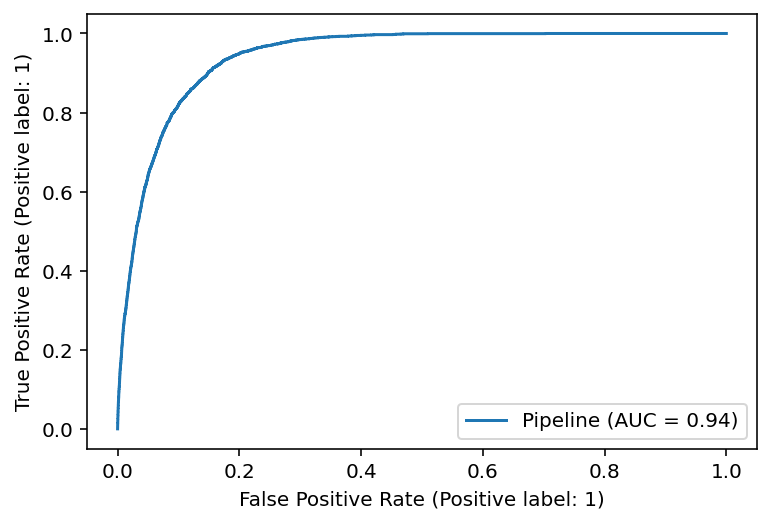

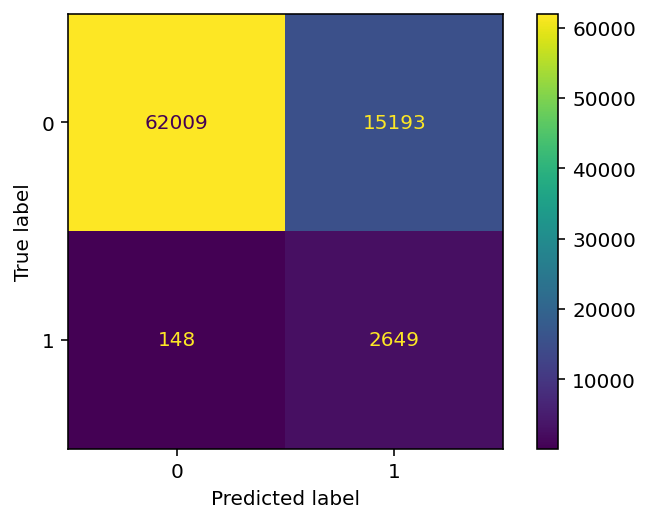

In [ ]:
# AUC curve for the best_estimator
y_pred_proba = grid_search.best_estimator_.predict_proba(x_baseline_df.fillna(0))[:,1]
metrics.plot_roc_curve(grid_search.best_estimator_, x_baseline_df.fillna(0), ys_baseline)

# plot the roc curve for the model 
metrics.plot_confusion_matrix(grid_search.best_estimator_, x_baseline_df.fillna(0), ys_baseline)


## 🧐 Model Interpretability

In [ ]:
# Function to overcame limitations of shap.summary with pipelines
def model_predict(data_asarray):
    data_asframe = pd.DataFrame(data_asarray)
    return grid_search.predict(data_asframe)

In [ ]:
# Init shap explainer. Here we used only 500 first data entries to avoid long computation time
explainer = shap.Explainer(model_predict, x_baseline_df[:500], check_additivity=False)
shap_values_single = explainer.shap_values(x_baseline_df[:500])

Permutation explainer: 501it [03:44,  2.13it/s]                         


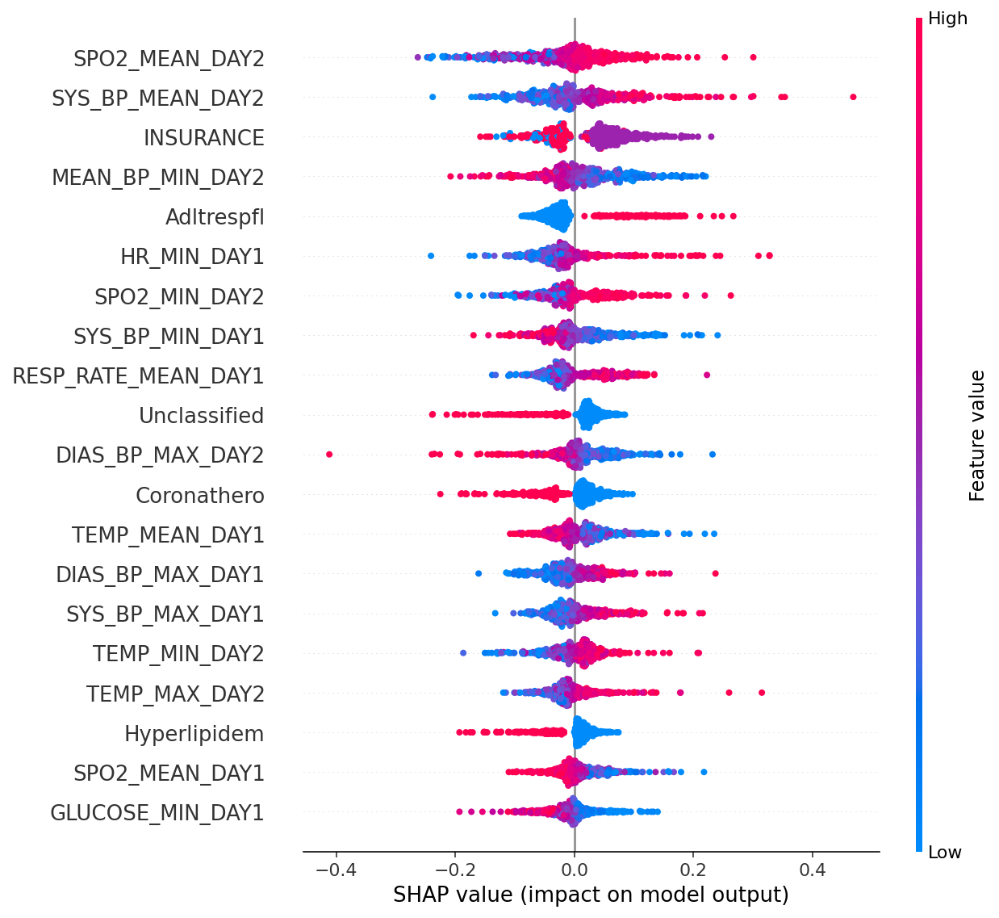

In [ ]:
shap.summary_plot(shap_values_single, x_baseline_df[:500])

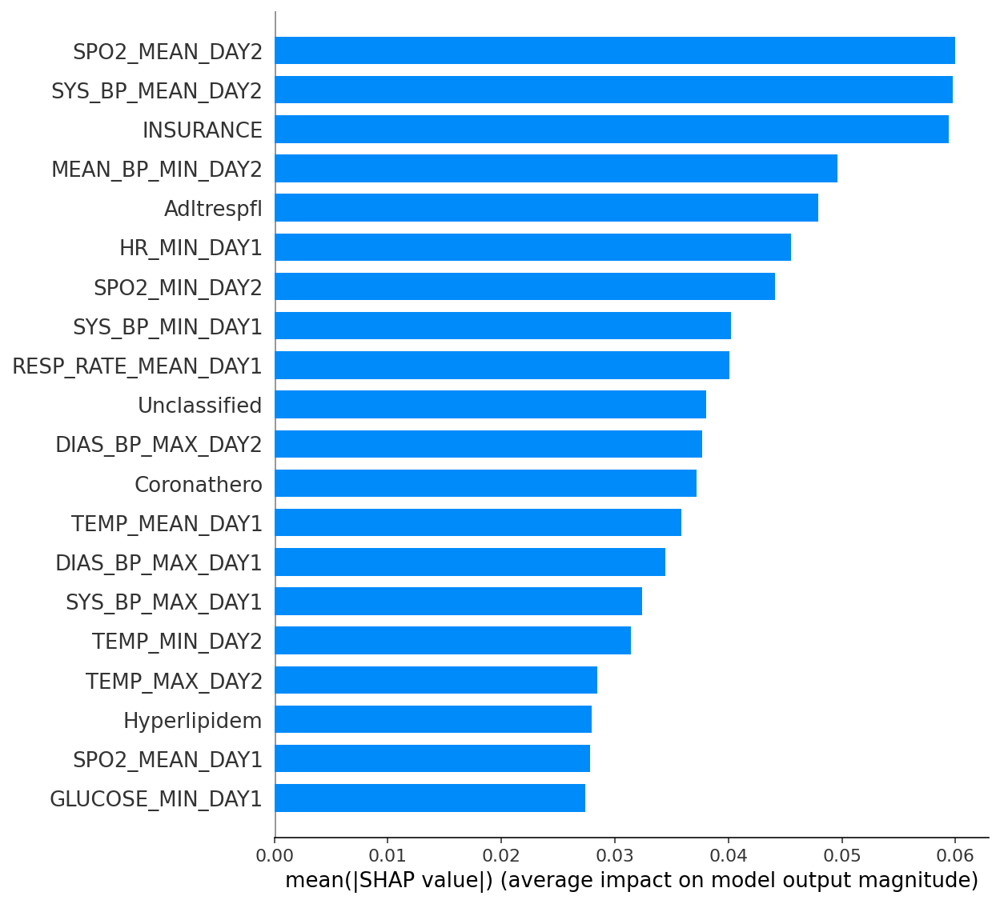

In [ ]:
# sort shap_values_single
shap.summary_plot(shap_values_single, x_baseline_df[:500], plot_type="bar")

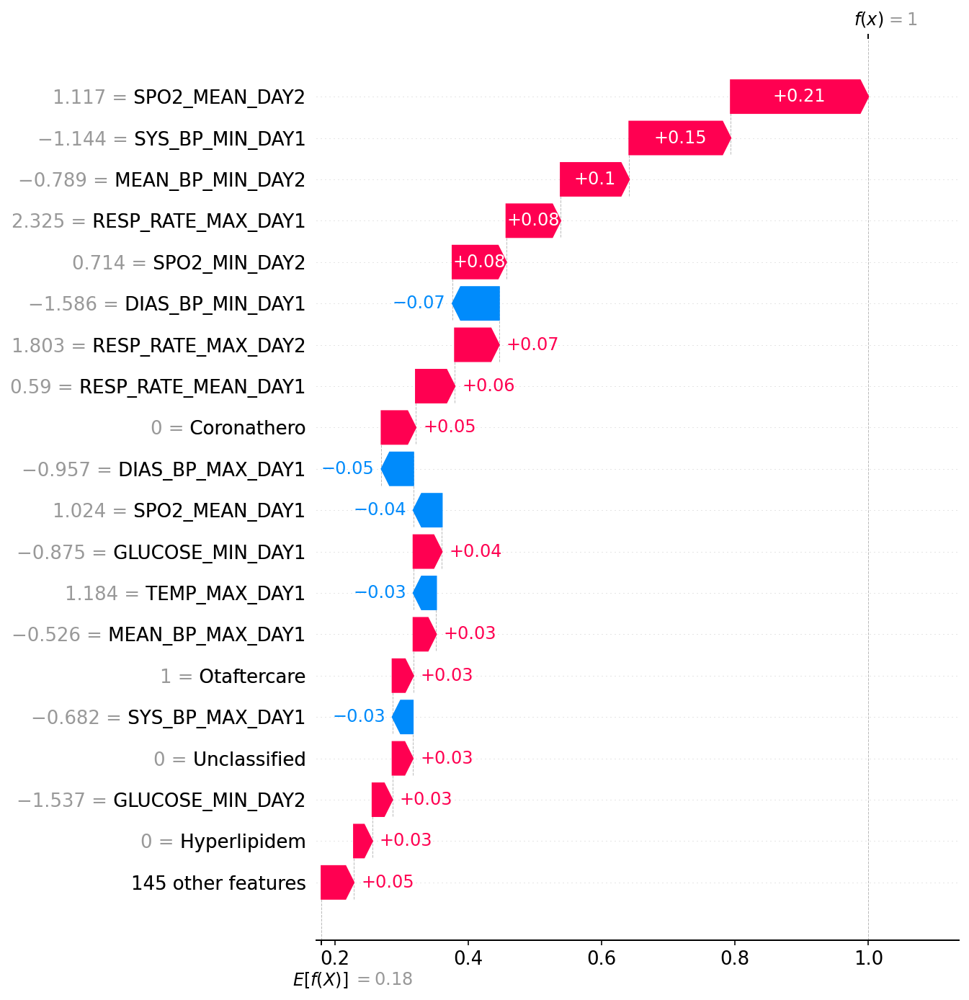

In [ ]:
shap.plots.waterfall(shap_values_single[266], max_display=20)

In [ ]:
shap.plots.force(shap_values_single)

<AxesSubplot:>

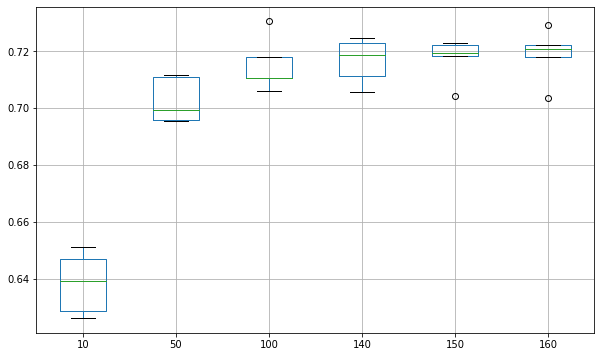

In [ ]:
n_comp = [10,50,100,140,150,160]
val_scores_rf = []
for n in n_comp:
    model = ensemble.RandomForestClassifier(n_estimators=1000, max_depth=5, random_state=42)

    pca = decomposition.PCA(n)
    rus = RandomUnderSampler()
    pipeline_estimator = imb_pipeline.Pipeline([("pca",pca),("resampling", rus), ("model", model)])

    score = model_selection.cross_val_score(pipeline_estimator,x_baseline,ys_baseline,cv=5,scoring="balanced_accuracy")
    val_scores_rf.append(score)

plt.figure(figsize=(10,6))
val_scores_dataframe_rf = pd.DataFrame(np.array(val_scores_rf).T,columns=n_comp)
val_scores_dataframe_rf.boxplot()

<AxesSubplot:>

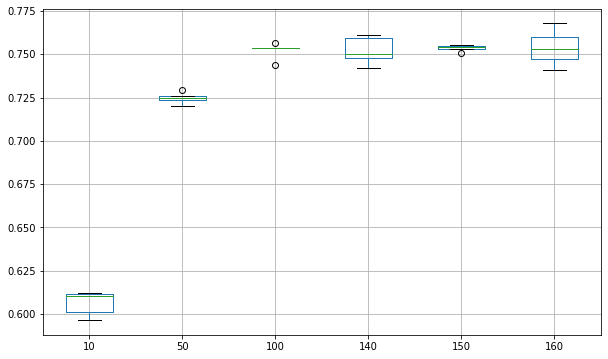

In [ ]:
n_comp = [10,50,100,140,150,160]
# n_comp = [160]
val_scores_xgb = []
for n in n_comp:
    model = xgb.XGBClassifier(
        verbosity= 0, 
        reg_lambda= 1, reg_alpha= 0.5, n_estimators= 1700, 
        min_child_weight= 5, max_depth= 5, learning_rate= 0.1, 
        gamma= 0.5, colsample_bytree= 0.5
    )

    pca = decomposition.PCA(n)
    rus = RandomUnderSampler()
    pipeline_estimator = imb_pipeline.Pipeline([("pca",pca),("resampling", rus), ("model", model)])

    score = model_selection.cross_val_score(pipeline_estimator,x_baseline,ys_baseline,cv=5,scoring="balanced_accuracy")
    val_scores_xgb.append(score)
    
plt.figure(figsize=(10,6))
val_scores_dataframe_xgb = pd.DataFrame(np.array(val_scores_xgb).T,columns=n_comp)
val_scores_dataframe_xgb.boxplot()

### Explanation of what you have achieved, conclusion and perspectives

### Best results:
* Random Forest : 0.70
* XGBoostClassifier : 0.76
* LGBMClassifier    :  0.77 


### What we tried :

##### Different models:
* RandomForest 
* XGBoost 
* LGBMClassifier

##### Different resampling techniques:
* RandomOverSampler (gave bad results)
* SMOTE (gave mediocre results)
* SMOTETomek (gave mediocre results)
* RandomUnderSampler (gave one of the best results)
* RandomUnderSampler(0.8 ratio) + BorderlineSMOTE (best results)

##### Feature selection:
We tried RFE (recursive feature selection) with sikit-learn but it didn't seem to have any impact on the score.

##### Weights of class:
We also tried to use weights and positive class scaling, but it doesnt gave much impact. 

### What we used to choose hyperparameters : 
We starts by using RandomizedSearchCV because it's faster to validate more ideas, then we do a GridSearchCV to find the best hyperparameters. 


### Comparing training time of the main models we used :
XGBoost seem to take a more time than Randomforest. However, what has to have the biggest impact on the training time is :
* The number of trees or rounds in the model (n_estimators) since all our models are based on decision trees.
* The resampling technique used, undersampling is obviously the fastest to train since we have a smaller training set.
* Number of components of the PCA, less components means smaller training set.
* Faster models. LGBM is greatly faster thatn XGBoost because of level-wise growth instead of leaf-wise. This reduce training time and helps to get more reounds of 

### What would you have done if you had had more time?
* We would maybe spend more time trying feature selection, we gave up on it fast when it seems to not impact the score. However, with some background knowledge behind the nature of the data, we could come up with smarted ideas. 
* Also, we might try other models deep learning models, although decision tree based models are quite popular when it comes to unbalanced classification. 


---

# Note on the dataset

The dataset does not contain actual medical data. It is not allowed to share these **confidential data** from ICU patients. To avoid this problem, the data have been replaced with **artificial data**.

To have credible data, they were generated using a generative adversarial network (**GAN**) Wasserstein.

For more information: <br/>
Andrew Yale, Saloni Dash, Ritik Dutta, Isabelle Guyon, Adrien Pavao, et al. [Privacy Preserving Synthetic Health Data](https://hal.inria.fr/hal-02160496/document). ESANN 2019 - European Symposium on Artificial Neural Networks, Computational Intelligence and Machine Learning, Apr 2019, Bruges, Belgium.

---

## Basement. Code for testing and other stuff

In [ ]:

# SCORINGS = 'balanced_accuracy'

# kf = model_selection.KFold(n_splits=4, shuffle=True, random_state=42)
# pca = decomposition.PCA()
# balancing = imblearn.over_sampling.SMOTENC(categorical_features=categorical_mask, n_jobs=5)
# balancing_2 = imblearn.under_sampling.RandomUnderSampler(random_state=42)
# balancing_1 = imblearn.under_sampling.TomekLinks(n_jobs=10)

# model = xgb.XGBClassifier(reg_lambda = 0.5, reg_alpha= 0.1, n_estimators=2000 ,min_child_weight=10, 
#                               max_depth=7, learning_rate= 0.01, gamma=0.5, colsample_bytree=0.5)

# # model = imb_pipeline.Pipeline([("balancing", balancing), ("pca", pca), ("model", pipe_model)])
# # model = imb_pipeline.Pipeline([("balancing_1", balancing_1), ("balancing_2", balancing_2), ("pca", pca), ("model", pipe_model)])
# # pipeline_grid = imb_pipeline.Pipeline([("balancing_1", balancing_1), ("balancing_2", balancing_2), ("pca", pca), ("model", model)])
# pipeline_grid = imb_pipeline.Pipeline([("balancing", balancing), ("pca", pca), ("model", model)])

# param_grid = {
#     "pca__n_components": [30, 50, 100, 150],
#     "model__max_depth": [5, 6, 8, 10],
#     "model__min_child_weight": [1, 5, 10],
#     "model__scale_pos_weight": [1, 2],
#     "model__n_estimators": [500],
#     "model__colsample_bytree": [0.5, 0.7],
#     "model__learning_rate": [0.1],
#     "model__reg_alpha": [0.5, 1],
#     "model__reg_lambda": [0.1, 0.5, 1],
#     "model__gamma": [0.1, 0.5, 1],
#     "model__verbosity" : [0]
# }

# grid_search = RandomizedSearchCV(pipeline_grid, param_distributions=param_grid, cv=kf, scoring=SCORINGS, 
#     n_iter=10, verbose=False, n_jobs=10)
# grid_search.fit(x_baseline_df[:5000].fillna(0), ys_baseline[:5000])

# print(grid_search.best_params_)
# print(f"CV score: {grid_search.best_score_.mean():.3g} +/- {grid_search.best_score_.std()*2:.3g}")

In [ ]:
# y_pred = grid_search.best_estimator_.predict(x_baseline_df)  # predictions
# predictions = [value for value in y_pred]
# # evaluate predictions

# accuracy = metrics.balanced_accuracy_score(ys_baseline, predictions)
# print("Accuracy: %.2f%%" % (accuracy * 100.0))

In [ ]:
from matplotlib import pyplot

kf = model_selection.KFold(n_splits=4, shuffle=True, random_state=42)
pca = decomposition.PCA(n_components=120)


balancing_1 = imblearn.under_sampling.RandomUnderSampler(random_state=42, sampling_strategy=0.8)

balancing_2 = imblearn.over_sampling.BorderlineSMOTE(random_state=42, kind='borderline-1')

# Make validation and train
x_train, x_valid, y_train, y_valid = model_selection.train_test_split(x_baseline_df[:].fillna(0), ys_baseline[:], test_size=0.2, random_state=42)


x_train_balanced, y_train_balanced = balancing_1.fit_resample(x_train, y_train)
x_train_balanced, y_train_balanced = balancing_2.fit_resample(x_train_balanced, y_train_balanced)


# x_train_curve = pca.fit_transform(x_train_balanced)
# x_valid_curve = pca.transform(x_valid)

x_valid_curve = x_valid.copy()
x_train_curve = x_train_balanced.copy()
y_valid_curve = y_valid.copy()
y_train_curve = y_train_balanced.copy()

x_valid_curve, y_valid_curve = imblearn.under_sampling.RandomUnderSampler(random_state=42, sampling_strategy=1).fit_resample(x_valid_curve, y_valid_curve)

pipe_model = xgb.XGBClassifier(reg_lambda = 0.5, reg_alpha= 0.1, n_estimators=600 ,min_child_weight= 10, 
                              learning_rate= 0.05, gamma=0.5, colsample_bytree=0.5)

# model = imb_pipeline.Pipeline([("balancing", balancing), ("pca", pca), ("model", pipe_model)])
# model = imb_pipeline.Pipeline([("balancing_1", balancing_1), ("balancing_2", balancing_2), ("pca", pca), ("model", pipe_model)])
model = imb_pipeline.Pipeline([("model", pipe_model)])

eval_set = [(x_train_curve, y_train_curve), (x_valid_curve, y_valid_curve)]

model.fit(x_train_balanced, y_train_balanced, model__eval_metric=["error", "logloss"], model__eval_set=eval_set, model__verbose=True)

# make predictions for test data
y_pred = model.predict(x_valid)
predictions = [value for value in y_pred]
# evaluate predictions

accuracy = metrics.balanced_accuracy_score(y_valid, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
# retrieve performance metrics
results = model['model'].evals_result()
epochs = len(results['validation_0']['error'])
x_axis = range(0, epochs)
# plot log loss
fig, ax = pyplot.subplots()
ax.plot(x_axis, results['validation_0']['logloss'], label='Train')
ax.plot(x_axis, results['validation_1']['logloss'], label='Test')
ax.legend()
pyplot.ylabel('Log Loss')
pyplot.title('XGBoost Log Loss')
pyplot.show()
# plot classification error
fig, ax = pyplot.subplots()
ax.plot(x_axis, results['validation_0']['error'], label='Train')
ax.plot(x_axis, results['validation_1']['error'], label='Test')
ax.legend()
pyplot.ylabel('Classification Error')
pyplot.title('XGBoost Classification Error')
pyplot.show()



<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=f8a3ba74-19a3-46ad-ae1a-1ea4601ae2c1' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>